# Field Detection using Semi-supervised SimCLR

In [21]:
import math
import matplotlib.pyplot as plt

import tensorflow as tf
tf.get_logger().setLevel('ERROR')
tf.autograph.set_verbosity(1)
import tensorflow_datasets as tfds
from tensorflow import keras
from tensorflow.keras import layers

import pandas as pd
import numpy as np

import folium
import h3

In [22]:
from pathlib import Path
parquet_dir_training = Path('D:\hexes_with_pixels_s2\hex_index_L3=832a89fffffffff')
parquet_dir_validation = Path('D:\hexes_with_pixels_s2\hex_index_L3=832a90fffffffff')

In [23]:
df = pd.concat(
            pd.read_parquet(parquet_file)
            for parquet_file in parquet_dir_training.glob('*.parquet')
         )

display(df.head(5))
print(df.shape)

,start_date,end_date,FIELD_OPERATION_GUID,scene_id,hex,SCL_val,s2_tile,B01,B02,B03,B04,B05,B06,B07,B08,B8A,B09,B11,B12
0,2020-07-11T19:25:31.600000+00:00,2021-07-18T22:12:40.268000+00:00,07571e4f-0822-4803-aa14-c0cd079e414c 2020-11-08,S2A_MSIL2A_20200712T155911_N0214_R097_T17SQA_2...,8c2a891134001ff,4,17SQA,733.0,1005.0,1648.0,1626.0,2284.0,4004.0,4304.0,4352.0,4589.0,4563.0,3291.0,2215.0
1,2020-07-11T19:25:31.600000+00:00,2021-07-18T22:12:40.268000+00:00,07571e4f-0822-4803-aa14-c0cd079e414c 2020-11-08,S2A_MSIL2A_20200712T155911_N0214_R097_T17SQA_2...,8c2a891134003ff,4,17SQA,733.0,893.0,1566.0,1484.0,1953.0,3775.0,4208.0,4464.0,4457.0,4563.0,3076.0,1952.0
2,2020-07-11T19:25:31.600000+00:00,2021-07-18T22:12:40.268000+00:00,07571e4f-0822-4803-aa14-c0cd079e414c 2020-11-08,S2A_MSIL2A_20200712T155911_N0214_R097_T17SQA_2...,8c2a891134005ff,4,17SQA,714.0,469.0,911.0,664.0,1527.0,3296.0,3777.0,3946.0,4145.0,4273.0,2715.0,1561.0
3,2020-07-11T19:25:31.600000+00:00,2021-07-18T22:12:40.268000+00:00,07571e4f-0822-4803-aa14-c0cd079e414c 2020-11-08,S2A_MSIL2A_20200712T155911_N0214_R097_T17SQA_2...,8c2a891134007ff,4,17SQA,714.0,469.0,911.0,664.0,1527.0,3296.0,3777.0,4052.0,4145.0,4273.0,2715.0,1561.0
4,2020-07-11T19:25:31.600000+00:00,2021-07-18T22:12:40.268000+00:00,07571e4f-0822-4803-aa14-c0cd079e414c 2020-11-08,S2A_MSIL2A_20200712T155911_N0214_R097_T17SQA_2...,8c2a891134009ff,4,17SQA,733.0,937.0,1550.0,1522.0,2450.0,4127.0,4493.0,4368.0,4633.0,4563.0,3493.0,2380.0


(123663, 19)


In [24]:
center = h3.h3_to_geo_boundary(h=df.iloc[0]['hex'],geo_json=True)

df = df.drop_duplicates(subset='hex', keep="first")

m = folium.Map(location=(center[0][1], center[0][0]),
                tiles = 'https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}',
                attr = 'Esri',
                name = 'Esri Satellite',
                zoom_start=16,
                overlay = False,
                control = True)

for index, row in df.iterrows():
    geometry = { "type" : "Polygon", "coordinates": [h3.h3_to_geo_boundary(h=row['hex'],geo_json=True)]}
    geo_j = folium.GeoJson(data=geometry, style_function=lambda x: {'fillColor': 'orange', 'color': 'green', 'weight': 0.5})
    folium.Popup(str(row['hex'])).add_to(geo_j)
    geo_j.add_to(m)

m

In [25]:
positive_samples = ['8c2a89113412bff', '8c2a891134069ff', '8c2a8911340cbff', '8c2a891acbb5dff', '8c2a891acba3dff', 
                    '8c2a891aa918bff', '8c2a891a85969ff']

negative_samples = ['8c2a891134ad3ff', '8c2a891a8c515ff', '8c2a891a8c509ff', '8c2a891a8c55bff', '8c2a891ae2d19ff', 
                    '8c2a891a86eb7ff', '8c2a891a82a67ff', '8c2a891134ae3ff', '8c2a891a86ccbff', '8c2a891a86ea5ff',
                    '8c2a891a861a1ff', '8c2a891aa9a8bff']

In [58]:
image_size = 12
image_channels = 1
width = 128
temperature = 0.1

steps_per_epoch = 20
AUTOTUNE = tf.data.AUTOTUNE
shuffle_buffer = 50
input_shape = (12,12,1)
width = 256
width = 5
num_epochs = 140

temperature = 0.1
queue_size = 10000
contrastive_augmentation = {"min_area": 0.25, "brightness": 1, "jitter": 0.2}
classification_augmentation = {"min_area": 0.75, "brightness": 1, "jitter": 0.1}

In [63]:
def prepare_dataset():

    df = pd.concat(
            pd.read_parquet(parquet_file)
            for parquet_file in parquet_dir_training.glob('*.parquet')
         )
    
    df['y'] = np.where(np.isin(df['hex'],positive_samples), 1, -1)
    df['y'] = np.where(df['hex'].isin(negative_samples), 0, df['y'])
    
    print('Positive labeled samples:', sum(df.y==1))
    print('Negative labeled samples:', sum(df.y==0))
    print('Unlabeled labeled samples:', sum(df.y==-1))
    
    df_labeled = df[df.y != -1]
    df_unlabeled = df[df.y == -1]
    
    df_labeled = df_labeled[['B01','B02','B03','B04','B05','B06','B07','B08','B8A','B09','B11','B12', 'y']].astype('int')
    df_unlabeled = df_unlabeled[['B01','B02','B03','B04','B05','B06','B07','B08','B8A','B09','B11','B12', 'y']].astype('int')
    
    df_labeled_X = df_labeled.loc[:,df_labeled.columns != 'y']
    df_labeled_X_array = df_labeled_X.values.reshape(df_labeled_X.shape[0], 4, 3)
    # expand to an image
    df_labeled_X_array = np.resize(df_labeled_X_array, [df_labeled_X_array.shape[0],1,12])
    df_labeled_X_array = np.repeat(df_labeled_X_array, 12, axis=1)
    
    
    df_unlabeled_X = df_unlabeled.loc[:,df_unlabeled.columns != 'y']
    df_unlabeled_X_array = df_unlabeled_X.values.reshape(df_unlabeled_X.shape[0], 4, 3)
    # expand to an image
    df_unlabeled_X_array = np.resize(df_unlabeled_X_array, [df_unlabeled_X_array.shape[0],1,12])
    df_unlabeled_X_array = np.repeat(df_unlabeled_X_array, 12, axis=1)
    
    unlabeled_train_images = df_unlabeled.shape[0]
    labeled_train_images = df_labeled.shape[0]
    
    unlabeled_batch_size = unlabeled_train_images // steps_per_epoch
    labeled_batch_size = labeled_train_images // steps_per_epoch
    batch_size = unlabeled_batch_size + labeled_batch_size
    print('Batch size:', batch_size)
    

    unlabeled_train_dataset = tf.data.Dataset\
        .from_tensor_slices((df_unlabeled_X_array, 
                            df_unlabeled.loc[:,df_unlabeled.columns == 'y'].values.T[0]))\
        .shuffle(50)\
        .batch(60, drop_remainder=True)
    
    labeled_train_dataset = tf.data.Dataset\
        .from_tensor_slices((df_labeled_X_array,
                             df_labeled.loc[:,df_labeled.columns == 'y'].values.T[0]))\
        .shuffle(50)\
        .batch(60, drop_remainder=True)
    
    test_dataset = tf.data.Dataset\
        .from_tensor_slices((df_labeled_X_array,
                             df_labeled.loc[:,df_labeled.columns == 'y'].values.T[0]))\
        .batch(60)\
        .prefetch(buffer_size=tf.data.AUTOTUNE)
    
   
    train_dataset = tf.data.Dataset.zip(
        (unlabeled_train_dataset,labeled_train_dataset)
    ).prefetch(buffer_size=AUTOTUNE)

    return batch_size, train_dataset, labeled_train_dataset, test_dataset

    
    
batch_size, train_dataset, labeled_train_dataset, test_dataset = prepare_dataset()

Positive labeled samples: 633
Negative labeled samples: 672
Unlabeled labeled samples: 122358
Batch size: 6182


In [64]:
df = pd.concat(
            pd.read_parquet(parquet_file)
            for parquet_file in parquet_dir_training.glob('*.parquet')
         )
    
df['y'] = np.where(np.isin(df['hex'],positive_samples), 1, -1)
df['y'] = np.where(df['hex'].isin(negative_samples), 0, df['y'])

print('Positive labeled samples:', sum(df.y==1))
print('Negative labeled samples:', sum(df.y==0))
print('Unlabeled labeled samples:', sum(df.y==-1))

df_labeled = df[df.y != -1]
df_unlabeled = df[df.y == -1]

display(df_labeled[['hex', 'B01','B02','B03','B04','B05','B06','B07','B08','B8A','B09','B11','B12', 'y']].head(5))

Positive labeled samples: 633
Negative labeled samples: 672
Unlabeled labeled samples: 122358


,hex,B01,B02,B03,B04,B05,B06,B07,B08,B8A,B09,B11,B12,y
46,8c2a891134069ff,722.0,977.0,1630.0,1686.0,2502.0,3986.0,4366.0,4468.0,4571.0,4518.0,3540.0,2422.0,1
73,8c2a8911340cbff,634.0,779.0,1426.0,1388.0,2284.0,3876.0,4269.0,4184.0,4363.0,4281.0,3319.0,2107.0,1
107,8c2a89113412bff,773.0,899.0,1562.0,1522.0,2411.0,4147.0,4546.0,4364.0,4670.0,4487.0,3476.0,2217.0,1
285,8c2a891134ad3ff,549.0,275.0,570.0,357.0,979.0,3006.0,3714.0,3826.0,4108.0,4162.0,2011.0,1070.0,0
289,8c2a891134ae3ff,378.0,211.0,489.0,263.0,1140.0,3155.0,3887.0,3996.0,4149.0,3993.0,2275.0,1203.0,0


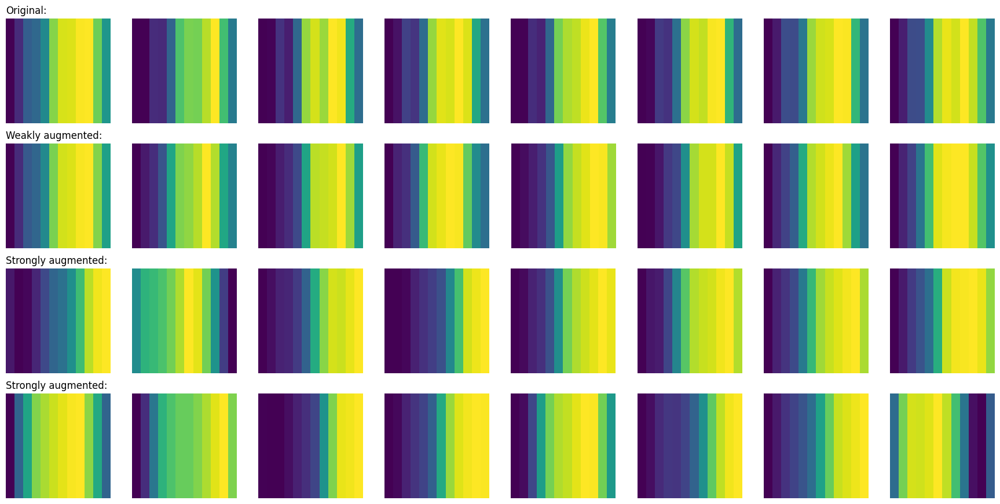

In [65]:
# Distorts the color distibutions of images
class RandomColorAffine(layers.Layer):
    def __init__(self, brightness=0, jitter=0, **kwargs):
        super().__init__(**kwargs)

        self.brightness = brightness
        self.jitter = jitter

    def get_config(self):
        config = super().get_config()
        config.update({"brightness": self.brightness, "jitter": self.jitter})
        return config

    def call(self, images, training=True):
        if training:
            batch_size = tf.shape(images)[0]

            # Same for all colors
            brightness_scales = 1 + tf.random.uniform(
                (batch_size, 1, 1, 1), minval=-self.brightness, maxval=self.brightness
            )
            # Different for all colors
            jitter_matrices = tf.random.uniform(
                (batch_size, 1, 1, 1), minval=-self.jitter, maxval=self.jitter
            )

            color_transforms = (
                tf.eye(1, batch_shape=[batch_size, 1]) * brightness_scales
                + jitter_matrices
            )
            images = tf.clip_by_value(tf.matmul(images, color_transforms), 0, 1)
        return images

# Define the encoder architecture
def get_encoder():
    return keras.Sequential(
        [
            keras.Input(shape=(image_size, image_size, image_channels)),
            layers.Conv2D(width, kernel_size=1, strides=2, activation="relu"),
            layers.Conv2D(width, kernel_size=1, strides=2, activation="relu"),
            layers.Conv2D(width, kernel_size=1, strides=2, activation="relu"),
            layers.Conv2D(width, kernel_size=1, strides=2, activation="relu"),
            layers.Flatten(),
            layers.Dense(width, activation="relu"),
        ],
        name="encoder",
    )

# Image augmentation module
def get_augmenter(min_area, brightness, jitter):
    zoom_factor = 1.0 - math.sqrt(min_area)
    return keras.Sequential(
        [
            keras.Input(shape=(image_size, image_size, image_channels)),
            layers.Rescaling(1 / 255),
            #layers.RandomFlip("horizontal"),
            layers.RandomTranslation(zoom_factor / 2, zoom_factor / 2),
            layers.RandomZoom((-zoom_factor, 0.0), (-zoom_factor, 0.0)),
            #RandomColorAffine(brightness, jitter),
        ]
    )


def visualize_augmentations(num_images):
    # Sample a batch from a dataset
    images = next(iter(train_dataset))[0][0][:num_images]
    # Apply augmentations
    augmented_images = zip(
        images,
        get_augmenter(**classification_augmentation)(images),
        get_augmenter(**contrastive_augmentation)(images),
        get_augmenter(**contrastive_augmentation)(images),
    )
    row_titles = [
        "Original:",
        "Weakly augmented:",
        "Strongly augmented:",
        "Strongly augmented:",
    ]
    plt.figure(figsize=(num_images * 2.2, 4 * 2.2), dpi=100)
    for column, image_row in enumerate(augmented_images):
        for row, image in enumerate(image_row):
            plt.subplot(4, num_images, row * num_images + column + 1)
            plt.imshow(image)
            if column == 0:
                plt.title(row_titles[row], loc="left")
            plt.axis("off")
    plt.tight_layout()


visualize_augmentations(num_images=8)

In [ ]:
# Baseline supervised training with random initialization
baseline_model = keras.Sequential(
    [
        keras.Input(shape=(image_size, image_size, image_channels)),
        get_augmenter(**classification_augmentation),
        get_encoder(),
        layers.Dense(2),
    ],
    name="baseline_model",
)
baseline_model.compile(
    optimizer=keras.optimizers.Adam(),
    loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=[keras.metrics.SparseCategoricalAccuracy(name="acc")],
)

baseline_history = baseline_model.fit(
    labeled_train_dataset, epochs=num_epochs, validation_data=test_dataset
)

print(
    "Maximal validation accuracy: {:.2f}%".format(
        max(baseline_history.history["val_acc"]) * 100
    )
)

In [92]:
x = tf.constant([[3.0], [4.0], [4.0], [4.0], [4.0]])
y = tf.constant([[3.0], [4.0], [4.0], [4.0], [4.0]])

similarities = (
            tf.matmul(x, y, transpose_b=True) / 2
        )

print(similarities)

tf.Tensor(
[[4.5 6.  6.  6.  6. ]
 [6.  8.  8.  8.  8. ]
 [6.  8.  8.  8.  8. ]
 [6.  8.  8.  8.  8. ]
 [6.  8.  8.  8.  8. ]], shape=(5, 5), dtype=float32)


In [94]:
# Define the contrastive model with model-subclassing
class ContrastiveModel(keras.Model):
    def __init__(self):
        super().__init__()

        self.temperature = temperature
        self.contrastive_augmenter = get_augmenter(**contrastive_augmentation)
        self.classification_augmenter = get_augmenter(**classification_augmentation)
        self.encoder = get_encoder()
        # Non-linear MLP as projection head
        self.projection_head = keras.Sequential(
            [
                keras.Input(shape=(width,)),
                layers.Dense(width, activation="relu"),
                layers.Dense(width),
            ],
            name="projection_head",
        )
        # Single dense layer for linear probing
        self.linear_probe = keras.Sequential(
            [layers.Input(shape=(width,)), layers.Dense(2)], name="linear_probe"
        )

        self.encoder.summary()
        self.projection_head.summary()
        self.linear_probe.summary()

    def compile(self, contrastive_optimizer, probe_optimizer, **kwargs):
        super().compile(**kwargs)

        self.contrastive_optimizer = contrastive_optimizer
        self.probe_optimizer = probe_optimizer

        # self.contrastive_loss will be defined as a method
        self.probe_loss = keras.losses.SparseCategoricalCrossentropy(from_logits=True)

        self.contrastive_loss_tracker = keras.metrics.Mean(name="c_loss")
        self.contrastive_accuracy = keras.metrics.SparseCategoricalAccuracy(
            name="c_acc"
        )
        self.probe_loss_tracker = keras.metrics.Mean(name="p_loss")
        self.probe_accuracy = keras.metrics.SparseCategoricalAccuracy(name="p_acc")

    @property
    def metrics(self):
        return [
            self.contrastive_loss_tracker,
            self.contrastive_accuracy,
            self.probe_loss_tracker,
            self.probe_accuracy,
        ]

    def contrastive_loss(self, projections_1, projections_2):
        # InfoNCE loss (information noise-contrastive estimation)
        # NT-Xent loss (normalized temperature-scaled cross entropy)

        # Cosine similarity: the dot product of the l2-normalized feature vectors
        projections_1 = tf.math.l2_normalize(projections_1, axis=1) 
        
        #tf.print(projections_1, [projections_1], "projections_1", summarize=-1)
        
        projections_2 = tf.math.l2_normalize(projections_2, axis=1)
        similarities = (
            tf.matmul(projections_1, projections_2, transpose_b=True) / self.temperature
        )
        
        #tf.print(similarities, "similarities", summarize=-1)

        # The similarity between the representations of two augmented views of the
        # same image should be higher than their similarity with other views
        batch_size = tf.shape(projections_1)[0]
        tf.print(batch_size, "batch_size", summarize=-1)
        contrastive_labels = tf.range(batch_size)
        self.contrastive_accuracy.update_state(contrastive_labels, similarities)
        self.contrastive_accuracy.update_state(contrastive_labels, tf.transpose(similarities))

        # The temperature-scaled similarities are used as logits for cross-entropy
        # a symmetrized version of the loss is used here
        loss_1_2 = keras.losses.sparse_categorical_crossentropy(
            contrastive_labels, similarities, from_logits=True
        )
        loss_2_1 = keras.losses.sparse_categorical_crossentropy(
            contrastive_labels, tf.transpose(similarities), from_logits=True
        )
        return (loss_1_2 + loss_2_1) / 2

    def train_step(self, data):
        (unlabeled_images, _), (labeled_images, labels) = data

        # Both labeled and unlabeled images are used, without labels
        images = tf.concat((unlabeled_images, labeled_images), axis=0)
        shapeOp = tf.shape(images)
        with tf.compat.v1.Session() as sess:
            print(sess.run(shapeOp))
        
        # Each image is augmented twice, differently
        augmented_images_1 = self.contrastive_augmenter(images, training=True)
        augmented_images_2 = self.contrastive_augmenter(images, training=True)
        with tf.GradientTape() as tape:
            features_1 = self.encoder(augmented_images_1, training=True)
            #tf.print(features_1, [features_1], "features", summarize=-1)
            features_2 = self.encoder(augmented_images_2, training=True)
            # The representations are passed through a projection mlp
            projections_1 = self.projection_head(features_1, training=True)
            #tf.print(projections_1, [projections_1], "projections_1", summarize=-1)
            #tf.print(projections_1, [projections_1], "images")
            projections_2 = self.projection_head(features_2, training=True)
            contrastive_loss = self.contrastive_loss(projections_1, projections_2)
            #tf.print(contrastive_loss, [contrastive_loss], "contrastive_loss", summarize=-1)
        gradients = tape.gradient(
            contrastive_loss,
            self.encoder.trainable_weights + self.projection_head.trainable_weights,
        )
        self.contrastive_optimizer.apply_gradients(
            zip(
                gradients,
                self.encoder.trainable_weights + self.projection_head.trainable_weights,
            )
        )
        self.contrastive_loss_tracker.update_state(contrastive_loss)

        # Labels are only used in evalutation for an on-the-fly logistic regression
        preprocessed_images = self.classification_augmenter(
            labeled_images, training=True
        )
        with tf.GradientTape() as tape:
            # the encoder is used in inference mode here to avoid regularization
            # and updating the batch normalization paramers if they are used
            features = self.encoder(preprocessed_images, training=False)
            class_logits = self.linear_probe(features, training=True)
            probe_loss = self.probe_loss(labels, class_logits)
        gradients = tape.gradient(probe_loss, self.linear_probe.trainable_weights)
        self.probe_optimizer.apply_gradients(
            zip(gradients, self.linear_probe.trainable_weights)
        )
        self.probe_loss_tracker.update_state(probe_loss)
        self.probe_accuracy.update_state(labels, class_logits)

        return {m.name: m.result() for m in self.metrics}

    def test_step(self, data):
        labeled_images, labels = data

        # For testing the components are used with a training=False flag
        preprocessed_images = self.classification_augmenter(
            labeled_images, training=False
        )
        features = self.encoder(preprocessed_images, training=False)
        class_logits = self.linear_probe(features, training=False)
        probe_loss = self.probe_loss(labels, class_logits)
        self.probe_loss_tracker.update_state(probe_loss)
        self.probe_accuracy.update_state(labels, class_logits)

        # Only the probe metrics are logged at test time
        return {m.name: m.result() for m in self.metrics[2:]}


# Contrastive pretraining
pretraining_model = ContrastiveModel()
pretraining_model.compile(
    contrastive_optimizer=keras.optimizers.Adam(),
    probe_optimizer=keras.optimizers.Adam(),
)

pretraining_history = pretraining_model.fit(
    train_dataset, epochs=num_epochs, validation_data=test_dataset
)
print(
    "Maximal validation accuracy: {:.2f}%".format(
        max(pretraining_history.history["val_p_acc"]) * 100
    )
)

Model: "encoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_200 (Conv2D)         (None, 6, 6, 5)           10        
                                                                 
 conv2d_201 (Conv2D)         (None, 3, 3, 5)           30        
                                                                 
 conv2d_202 (Conv2D)         (None, 2, 2, 5)           30        
                                                                 
 conv2d_203 (Conv2D)         (None, 1, 1, 5)           30        
                                                                 
 flatten_50 (Flatten)        (None, 5)                 0         
                                                                 
 dense_196 (Dense)           (None, 5)                 30        
                                                                 
Total params: 130
Trainable params: 130
Non-trainable param

120 batch_size
12/21 [================>.............] - ETA: 0s - c_loss: 4.6440 - c_acc: 0.0365 - p_loss: 0.7578 - p_acc: 0.4653120 batch_size
120 batch_size
14/21 [===================>..........] - ETA: 0s - c_loss: 4.6468 - c_acc: 0.0363 - p_loss: 0.7540 - p_acc: 0.4810120 batch_size
120 batch_size
16/21 [=====================>........] - ETA: 0s - c_loss: 4.6405 - c_acc: 0.0370 - p_loss: 0.7526 - p_acc: 0.4979120 batch_size
120 batch_size
18/21 [========================>.....] - ETA: 0s - c_loss: 4.6390 - c_acc: 0.0356 - p_loss: 0.7505 - p_acc: 0.4972120 batch_size
120 batch_size
21/21 [==============================] - 1s 43ms/step - c_loss: 4.6445 - c_acc: 0.0355 - p_loss: 0.7522 - p_acc: 0.4873 - val_p_loss: 0.7402 - val_p_acc: 0.4843
Epoch 5/140
120 batch_size
 1/21 [>.............................] - ETA: 0s - c_loss: 4.5803 - c_acc: 0.0250 - p_loss: 0.7336 - p_acc: 0.5833120 batch_size
120 batch_size
 3/21 [===>..........................] - ETA: 0s - c_loss: 4.5610 - c_acc: 0.

 7/21 [=========>....................] - ETA: 0s - c_loss: 4.5467 - c_acc: 0.0440 - p_loss: 0.7308 - p_acc: 0.3167120 batch_size
120 batch_size
 9/21 [===========>..................] - ETA: 0s - c_loss: 4.5675 - c_acc: 0.0412 - p_loss: 0.7308 - p_acc: 0.3130120 batch_size
120 batch_size
11/21 [==============>...............] - ETA: 0s - c_loss: 4.5732 - c_acc: 0.0420 - p_loss: 0.7376 - p_acc: 0.2758120 batch_size
120 batch_size
13/21 [=================>............] - ETA: 0s - c_loss: 4.5857 - c_acc: 0.0455 - p_loss: 0.7400 - p_acc: 0.2731120 batch_size
120 batch_size
15/21 [====================>.........] - ETA: 0s - c_loss: 4.5955 - c_acc: 0.0439 - p_loss: 0.7378 - p_acc: 0.3033120 batch_size
120 batch_size
17/21 [=======================>......] - ETA: 0s - c_loss: 4.6013 - c_acc: 0.0412 - p_loss: 0.7375 - p_acc: 0.3000120 batch_size
120 batch_size
19/21 [==========================>...] - ETA: 0s - c_loss: 4.6153 - c_acc: 0.0414 - p_loss: 0.7347 - p_acc: 0.3061120 batch_size
120 bat

 7/21 [=========>....................] - ETA: 0s - c_loss: 4.6080 - c_acc: 0.0435 - p_loss: 0.7222 - p_acc: 0.2310120 batch_size
120 batch_size
 9/21 [===========>..................] - ETA: 0s - c_loss: 4.6061 - c_acc: 0.0440 - p_loss: 0.7211 - p_acc: 0.2204120 batch_size
120 batch_size
11/21 [==============>...............] - ETA: 0s - c_loss: 4.6138 - c_acc: 0.0424 - p_loss: 0.7243 - p_acc: 0.2015120 batch_size
120 batch_size
13/21 [=================>............] - ETA: 0s - c_loss: 4.6191 - c_acc: 0.0417 - p_loss: 0.7232 - p_acc: 0.2051120 batch_size
120 batch_size
15/21 [====================>.........] - ETA: 0s - c_loss: 4.6219 - c_acc: 0.0406 - p_loss: 0.7227 - p_acc: 0.2078120 batch_size
120 batch_size
19/21 [==========================>...] - ETA: 0s - c_loss: 4.6137 - c_acc: 0.0388 - p_loss: 0.7204 - p_acc: 0.2061120 batch_size
120 batch_size
21/21 [==============================] - 1s 49ms/step - c_loss: 4.6197 - c_acc: 0.0373 - p_loss: 0.7214 - p_acc: 0.1897 - val_p_loss: 0.

 4/21 [====>.........................] - ETA: 0s - c_loss: 4.5324 - c_acc: 0.0437 - p_loss: 0.7103 - p_acc: 0.1542120 batch_size
120 batch_size
 6/21 [=======>......................] - ETA: 0s - c_loss: 4.5544 - c_acc: 0.0500 - p_loss: 0.7117 - p_acc: 0.1500120 batch_size
120 batch_size
 8/21 [==========>...................] - ETA: 0s - c_loss: 4.5833 - c_acc: 0.0458 - p_loss: 0.7086 - p_acc: 0.1958120 batch_size
120 batch_size
10/21 [=============>................] - ETA: 0s - c_loss: 4.5891 - c_acc: 0.0437 - p_loss: 0.7086 - p_acc: 0.1717120 batch_size
120 batch_size
12/21 [================>.............] - ETA: 0s - c_loss: 4.5937 - c_acc: 0.0444 - p_loss: 0.7091 - p_acc: 0.1792120 batch_size
120 batch_size
14/21 [===================>..........] - ETA: 0s - c_loss: 4.6061 - c_acc: 0.0440 - p_loss: 0.7084 - p_acc: 0.1845120 batch_size
120 batch_size
16/21 [=====================>........] - ETA: 0s - c_loss: 4.6086 - c_acc: 0.0440 - p_loss: 0.7084 - p_acc: 0.1802120 batch_size
120 bat

21/21 [==============================] - 1s 46ms/step - c_loss: 4.6102 - c_acc: 0.0387 - p_loss: 0.6972 - p_acc: 0.3579 - val_p_loss: 0.6952 - val_p_acc: 0.4659
Epoch 24/140
120 batch_size
 1/21 [>.............................] - ETA: 0s - c_loss: 4.5841 - c_acc: 0.0375 - p_loss: 0.6973 - p_acc: 0.3500120 batch_size
120 batch_size
 3/21 [===>..........................] - ETA: 0s - c_loss: 4.5576 - c_acc: 0.0264 - p_loss: 0.6974 - p_acc: 0.3389120 batch_size
120 batch_size
 5/21 [======>.......................] - ETA: 0s - c_loss: 4.5446 - c_acc: 0.0450 - p_loss: 0.6975 - p_acc: 0.3467120 batch_size
120 batch_size
 7/21 [=========>....................] - ETA: 0s - c_loss: 4.5691 - c_acc: 0.0411 - p_loss: 0.6971 - p_acc: 0.3571120 batch_size
120 batch_size
 9/21 [===========>..................] - ETA: 0s - c_loss: 4.5991 - c_acc: 0.0384 - p_loss: 0.6962 - p_acc: 0.3981120 batch_size
120 batch_size
11/21 [==============>...............] - ETA: 0s - c_loss: 4.6008 - c_acc: 0.0379 - p_loss:

19/21 [==========================>...] - ETA: 0s - c_loss: 4.6283 - c_acc: 0.0456 - p_loss: 0.6842 - p_acc: 0.6132120 batch_size
120 batch_size
21/21 [==============================] - 1s 43ms/step - c_loss: 4.6319 - c_acc: 0.0429 - p_loss: 0.6832 - p_acc: 0.6294 - val_p_loss: 0.6841 - val_p_acc: 0.6582
Epoch 29/140
120 batch_size
 3/21 [===>..........................] - ETA: 1s - c_loss: 4.5882 - c_acc: 0.0264 - p_loss: 0.6818 - p_acc: 0.6000120 batch_size
120 batch_size
 5/21 [======>.......................] - ETA: 0s - c_loss: 4.6017 - c_acc: 0.0267 - p_loss: 0.6823 - p_acc: 0.6033120 batch_size
120 batch_size
 7/21 [=========>....................] - ETA: 0s - c_loss: 4.6203 - c_acc: 0.0292 - p_loss: 0.6828 - p_acc: 0.6143120 batch_size
120 batch_size
 9/21 [===========>..................] - ETA: 0s - c_loss: 4.6298 - c_acc: 0.0352 - p_loss: 0.6821 - p_acc: 0.6222120 batch_size
120 batch_size
11/21 [==============>...............] - ETA: 0s - c_loss: 4.6368 - c_acc: 0.0360 - p_loss:

15/21 [====================>.........] - ETA: 0s - c_loss: 4.6453 - c_acc: 0.0436 - p_loss: 0.6708 - p_acc: 0.7822120 batch_size
120 batch_size
17/21 [=======================>......] - ETA: 0s - c_loss: 4.6368 - c_acc: 0.0429 - p_loss: 0.6707 - p_acc: 0.7794120 batch_size
120 batch_size
19/21 [==========================>...] - ETA: 0s - c_loss: 4.6471 - c_acc: 0.0414 - p_loss: 0.6718 - p_acc: 0.7763120 batch_size
120 batch_size
21/21 [==============================] - 1s 42ms/step - c_loss: 4.6522 - c_acc: 0.0407 - p_loss: 0.6703 - p_acc: 0.7857 - val_p_loss: 0.6745 - val_p_acc: 0.7602
Epoch 34/140
120 batch_size
 1/21 [>.............................] - ETA: 0s - c_loss: 4.6163 - c_acc: 0.0375 - p_loss: 0.6743 - p_acc: 0.7833120 batch_size
120 batch_size
 4/21 [====>.........................] - ETA: 0s - c_loss: 4.5972 - c_acc: 0.0365 - p_loss: 0.6673 - p_acc: 0.7958120 batch_size
120 batch_size
 6/21 [=======>......................] - ETA: 0s - c_loss: 4.6036 - c_acc: 0.0410 - p_loss:

13/21 [=================>............] - ETA: 0s - c_loss: 4.6391 - c_acc: 0.0317 - p_loss: 0.6590 - p_acc: 0.8372120 batch_size
120 batch_size
15/21 [====================>.........] - ETA: 0s - c_loss: 4.6382 - c_acc: 0.0336 - p_loss: 0.6586 - p_acc: 0.8244120 batch_size
120 batch_size
17/21 [=======================>......] - ETA: 0s - c_loss: 4.6321 - c_acc: 0.0338 - p_loss: 0.6579 - p_acc: 0.8294120 batch_size
120 batch_size
19/21 [==========================>...] - ETA: 0s - c_loss: 4.6305 - c_acc: 0.0360 - p_loss: 0.6591 - p_acc: 0.8219120 batch_size
120 batch_size
21/21 [==============================] - 1s 43ms/step - c_loss: 4.6346 - c_acc: 0.0347 - p_loss: 0.6579 - p_acc: 0.8270 - val_p_loss: 0.6659 - val_p_acc: 0.7847
Epoch 39/140
120 batch_size
 1/21 [>.............................] - ETA: 0s - c_loss: 4.5717 - c_acc: 0.0542 - p_loss: 0.6739 - p_acc: 0.8167120 batch_size
120 batch_size
 4/21 [====>.........................] - ETA: 0s - c_loss: 4.6056 - c_acc: 0.0344 - p_loss:

11/21 [==============>...............] - ETA: 0s - c_loss: 4.6087 - c_acc: 0.0367 - p_loss: 0.6433 - p_acc: 0.8515120 batch_size
120 batch_size
13/21 [=================>............] - ETA: 0s - c_loss: 4.6175 - c_acc: 0.0385 - p_loss: 0.6478 - p_acc: 0.8397120 batch_size
120 batch_size
15/21 [====================>.........] - ETA: 0s - c_loss: 4.6271 - c_acc: 0.0372 - p_loss: 0.6478 - p_acc: 0.8344120 batch_size
120 batch_size
17/21 [=======================>......] - ETA: 0s - c_loss: 4.6204 - c_acc: 0.0390 - p_loss: 0.6466 - p_acc: 0.8382120 batch_size
120 batch_size
19/21 [==========================>...] - ETA: 0s - c_loss: 4.6169 - c_acc: 0.0390 - p_loss: 0.6474 - p_acc: 0.8316120 batch_size
120 batch_size
21/21 [==============================] - 1s 42ms/step - c_loss: 4.6212 - c_acc: 0.0379 - p_loss: 0.6467 - p_acc: 0.8317 - val_p_loss: 0.6585 - val_p_acc: 0.7801
Epoch 44/140
120 batch_size
 1/21 [>.............................] - ETA: 0s - c_loss: 4.6040 - c_acc: 0.0375 - p_loss:

 9/21 [===========>..................] - ETA: 0s - c_loss: 4.6539 - c_acc: 0.0245 - p_loss: 0.6415 - p_acc: 0.8222120 batch_size
120 batch_size
11/21 [==============>...............] - ETA: 0s - c_loss: 4.6449 - c_acc: 0.0288 - p_loss: 0.6366 - p_acc: 0.8379120 batch_size
120 batch_size
14/21 [===================>..........] - ETA: 0s - c_loss: 4.6582 - c_acc: 0.0274 - p_loss: 0.6384 - p_acc: 0.8262120 batch_size
120 batch_size
16/21 [=====================>........] - ETA: 0s - c_loss: 4.6561 - c_acc: 0.0258 - p_loss: 0.6378 - p_acc: 0.8219120 batch_size
120 batch_size
18/21 [========================>.....] - ETA: 0s - c_loss: 4.6482 - c_acc: 0.0289 - p_loss: 0.6382 - p_acc: 0.8231120 batch_size
120 batch_size
21/21 [==============================] - 1s 44ms/step - c_loss: 4.6504 - c_acc: 0.0300 - p_loss: 0.6375 - p_acc: 0.8262 - val_p_loss: 0.6512 - val_p_acc: 0.7824
Epoch 49/140
120 batch_size
 1/21 [>.............................] - ETA: 0s - c_loss: 4.5786 - c_acc: 0.0167 - p_loss:

 5/21 [======>.......................] - ETA: 0s - c_loss: 4.5692 - c_acc: 0.0350 - p_loss: 0.6134 - p_acc: 0.8767120 batch_size
120 batch_size
 7/21 [=========>....................] - ETA: 0s - c_loss: 4.5993 - c_acc: 0.0363 - p_loss: 0.6276 - p_acc: 0.8286120 batch_size
120 batch_size
 9/21 [===========>..................] - ETA: 0s - c_loss: 4.6229 - c_acc: 0.0389 - p_loss: 0.6295 - p_acc: 0.8241120 batch_size
120 batch_size
11/21 [==============>...............] - ETA: 0s - c_loss: 4.6121 - c_acc: 0.0402 - p_loss: 0.6270 - p_acc: 0.8273120 batch_size
120 batch_size
13/21 [=================>............] - ETA: 0s - c_loss: 4.6156 - c_acc: 0.0394 - p_loss: 0.6292 - p_acc: 0.8218120 batch_size
120 batch_size
15/21 [====================>.........] - ETA: 0s - c_loss: 4.6312 - c_acc: 0.0381 - p_loss: 0.6290 - p_acc: 0.8167120 batch_size
120 batch_size
17/21 [=======================>......] - ETA: 0s - c_loss: 4.6264 - c_acc: 0.0382 - p_loss: 0.6266 - p_acc: 0.8235120 batch_size
120 bat

 1/21 [>.............................] - ETA: 0s - c_loss: 4.6463 - c_acc: 0.0167 - p_loss: 0.6439 - p_acc: 0.7500120 batch_size
120 batch_size
 3/21 [===>..........................] - ETA: 0s - c_loss: 4.5798 - c_acc: 0.0306 - p_loss: 0.6133 - p_acc: 0.8389120 batch_size
120 batch_size
 5/21 [======>.......................] - ETA: 0s - c_loss: 4.5532 - c_acc: 0.0367 - p_loss: 0.6011 - p_acc: 0.8667120 batch_size
120 batch_size
 8/21 [==========>...................] - ETA: 0s - c_loss: 4.5790 - c_acc: 0.0323 - p_loss: 0.6239 - p_acc: 0.8292120 batch_size
120 batch_size
10/21 [=============>................] - ETA: 0s - c_loss: 4.5852 - c_acc: 0.0308 - p_loss: 0.6162 - p_acc: 0.8450120 batch_size
120 batch_size
12/21 [================>.............] - ETA: 0s - c_loss: 4.5938 - c_acc: 0.0340 - p_loss: 0.6180 - p_acc: 0.8333120 batch_size
120 batch_size
14/21 [===================>..........] - ETA: 0s - c_loss: 4.6097 - c_acc: 0.0327 - p_loss: 0.6225 - p_acc: 0.8143120 batch_size
120 bat

19/21 [==========================>...] - ETA: 0s - c_loss: 4.6197 - c_acc: 0.0408 - p_loss: 0.6124 - p_acc: 0.8272120 batch_size
120 batch_size
21/21 [==============================] - 1s 45ms/step - c_loss: 4.6211 - c_acc: 0.0405 - p_loss: 0.6114 - p_acc: 0.8325 - val_p_loss: 0.6332 - val_p_acc: 0.7762
Epoch 63/140
120 batch_size
 1/21 [>.............................] - ETA: 0s - c_loss: 4.6610 - c_acc: 0.0250 - p_loss: 0.6156 - p_acc: 0.8000120 batch_size
120 batch_size
 3/21 [===>..........................] - ETA: 0s - c_loss: 4.5377 - c_acc: 0.0375 - p_loss: 0.5927 - p_acc: 0.8667120 batch_size
120 batch_size
 5/21 [======>.......................] - ETA: 0s - c_loss: 4.5555 - c_acc: 0.0392 - p_loss: 0.6001 - p_acc: 0.8800120 batch_size
120 batch_size
 7/21 [=========>....................] - ETA: 0s - c_loss: 4.5752 - c_acc: 0.0435 - p_loss: 0.6058 - p_acc: 0.8476120 batch_size
120 batch_size
 9/21 [===========>..................] - ETA: 0s - c_loss: 4.6037 - c_acc: 0.0384 - p_loss:

16/21 [=====================>........] - ETA: 0s - c_loss: 4.6242 - c_acc: 0.0440 - p_loss: 0.6052 - p_acc: 0.8104120 batch_size
120 batch_size
18/21 [========================>.....] - ETA: 0s - c_loss: 4.6253 - c_acc: 0.0426 - p_loss: 0.6040 - p_acc: 0.8167120 batch_size
120 batch_size
21/21 [==============================] - 1s 45ms/step - c_loss: 4.6314 - c_acc: 0.0413 - p_loss: 0.6031 - p_acc: 0.8183 - val_p_loss: 0.6268 - val_p_acc: 0.7816
Epoch 68/140
120 batch_size
 1/21 [>.............................] - ETA: 0s - c_loss: 4.5624 - c_acc: 0.0375 - p_loss: 0.6311 - p_acc: 0.7833120 batch_size
120 batch_size
 3/21 [===>..........................] - ETA: 0s - c_loss: 4.6031 - c_acc: 0.0375 - p_loss: 0.5825 - p_acc: 0.8389120 batch_size
120 batch_size
 5/21 [======>.......................] - ETA: 0s - c_loss: 4.6060 - c_acc: 0.0400 - p_loss: 0.5910 - p_acc: 0.8600120 batch_size
120 batch_size
 7/21 [=========>....................] - ETA: 0s - c_loss: 4.6148 - c_acc: 0.0387 - p_loss:

11/21 [==============>...............] - ETA: 0s - c_loss: 4.6096 - c_acc: 0.0485 - p_loss: 0.5963 - p_acc: 0.8485120 batch_size
120 batch_size
13/21 [=================>............] - ETA: 0s - c_loss: 4.6182 - c_acc: 0.0474 - p_loss: 0.6022 - p_acc: 0.8333120 batch_size
120 batch_size
15/21 [====================>.........] - ETA: 0s - c_loss: 4.6269 - c_acc: 0.0442 - p_loss: 0.5993 - p_acc: 0.8256120 batch_size
120 batch_size
17/21 [=======================>......] - ETA: 0s - c_loss: 4.6146 - c_acc: 0.0434 - p_loss: 0.5963 - p_acc: 0.8265120 batch_size
120 batch_size
19/21 [==========================>...] - ETA: 0s - c_loss: 4.6261 - c_acc: 0.0434 - p_loss: 0.5999 - p_acc: 0.8237120 batch_size
120 batch_size
21/21 [==============================] - 1s 44ms/step - c_loss: 4.6277 - c_acc: 0.0421 - p_loss: 0.5956 - p_acc: 0.8341 - val_p_loss: 0.6209 - val_p_acc: 0.7801
Epoch 73/140
120 batch_size
 2/21 [=>............................] - ETA: 1s - c_loss: 4.5693 - c_acc: 0.0604 - p_loss:

 9/21 [===========>..................] - ETA: 0s - c_loss: 4.5718 - c_acc: 0.0301 - p_loss: 0.5908 - p_acc: 0.8259120 batch_size
120 batch_size
11/21 [==============>...............] - ETA: 0s - c_loss: 4.5890 - c_acc: 0.0322 - p_loss: 0.5825 - p_acc: 0.8379120 batch_size
120 batch_size
13/21 [=================>............] - ETA: 0s - c_loss: 4.5999 - c_acc: 0.0353 - p_loss: 0.5954 - p_acc: 0.8218120 batch_size
120 batch_size
15/21 [====================>.........] - ETA: 0s - c_loss: 4.6132 - c_acc: 0.0369 - p_loss: 0.5916 - p_acc: 0.8133120 batch_size
120 batch_size
17/21 [=======================>......] - ETA: 0s - c_loss: 4.6147 - c_acc: 0.0380 - p_loss: 0.5851 - p_acc: 0.8265120 batch_size
120 batch_size
19/21 [==========================>...] - ETA: 0s - c_loss: 4.6122 - c_acc: 0.0386 - p_loss: 0.5918 - p_acc: 0.8184120 batch_size
120 batch_size
21/21 [==============================] - 1s 43ms/step - c_loss: 4.6196 - c_acc: 0.0371 - p_loss: 0.5862 - p_acc: 0.8238 - val_p_loss: 0.

 4/21 [====>.........................] - ETA: 0s - c_loss: 4.5560 - c_acc: 0.0427 - p_loss: 0.5535 - p_acc: 0.8875120 batch_size
120 batch_size
 6/21 [=======>......................] - ETA: 0s - c_loss: 4.5513 - c_acc: 0.0500 - p_loss: 0.5718 - p_acc: 0.8667120 batch_size
120 batch_size
 9/21 [===========>..................] - ETA: 0s - c_loss: 4.6112 - c_acc: 0.0412 - p_loss: 0.5878 - p_acc: 0.8259120 batch_size
120 batch_size
11/21 [==============>...............] - ETA: 0s - c_loss: 4.5997 - c_acc: 0.0470 - p_loss: 0.5837 - p_acc: 0.8348120 batch_size
120 batch_size
13/21 [=================>............] - ETA: 0s - c_loss: 4.6094 - c_acc: 0.0449 - p_loss: 0.5914 - p_acc: 0.8141120 batch_size
120 batch_size
15/21 [====================>.........] - ETA: 0s - c_loss: 4.6165 - c_acc: 0.0431 - p_loss: 0.5877 - p_acc: 0.8078120 batch_size
120 batch_size
17/21 [=======================>......] - ETA: 0s - c_loss: 4.6115 - c_acc: 0.0436 - p_loss: 0.5788 - p_acc: 0.8216120 batch_size
120 bat

Epoch 87/140
120 batch_size
 1/21 [>.............................] - ETA: 0s - c_loss: 4.5618 - c_acc: 0.0417 - p_loss: 0.5890 - p_acc: 0.8333120 batch_size
120 batch_size
 3/21 [===>..........................] - ETA: 0s - c_loss: 4.5462 - c_acc: 0.0417 - p_loss: 0.5476 - p_acc: 0.8722120 batch_size
120 batch_size
 5/21 [======>.......................] - ETA: 0s - c_loss: 4.5336 - c_acc: 0.0483 - p_loss: 0.5420 - p_acc: 0.8867120 batch_size
120 batch_size
 7/21 [=========>....................] - ETA: 0s - c_loss: 4.6011 - c_acc: 0.0446 - p_loss: 0.5651 - p_acc: 0.8476120 batch_size
120 batch_size
 9/21 [===========>..................] - ETA: 0s - c_loss: 4.6170 - c_acc: 0.0444 - p_loss: 0.5757 - p_acc: 0.8315120 batch_size
120 batch_size
11/21 [==============>...............] - ETA: 0s - c_loss: 4.6120 - c_acc: 0.0462 - p_loss: 0.5716 - p_acc: 0.8439120 batch_size
120 batch_size
13/21 [=================>............] - ETA: 0s - c_loss: 4.6208 - c_acc: 0.0442 - p_loss: 0.5776 - p_acc: 

120 batch_size
21/21 [==============================] - 1s 44ms/step - c_loss: 4.6387 - c_acc: 0.0351 - p_loss: 0.5705 - p_acc: 0.8230 - val_p_loss: 0.6056 - val_p_acc: 0.7732
Epoch 92/140
120 batch_size
 1/21 [>.............................] - ETA: 0s - c_loss: 4.5816 - c_acc: 0.0250 - p_loss: 0.6399 - p_acc: 0.7500120 batch_size
120 batch_size
 3/21 [===>..........................] - ETA: 0s - c_loss: 4.5531 - c_acc: 0.0292 - p_loss: 0.5488 - p_acc: 0.8389120 batch_size
120 batch_size
 5/21 [======>.......................] - ETA: 0s - c_loss: 4.5280 - c_acc: 0.0367 - p_loss: 0.5355 - p_acc: 0.8700120 batch_size
120 batch_size
 7/21 [=========>....................] - ETA: 0s - c_loss: 4.5686 - c_acc: 0.0351 - p_loss: 0.5604 - p_acc: 0.8381120 batch_size
120 batch_size
 9/21 [===========>..................] - ETA: 0s - c_loss: 4.5868 - c_acc: 0.0338 - p_loss: 0.5723 - p_acc: 0.8241120 batch_size
120 batch_size
11/21 [==============>...............] - ETA: 0s - c_loss: 4.5836 - c_acc: 0

16/21 [=====================>........] - ETA: 0s - c_loss: 4.6111 - c_acc: 0.0383 - p_loss: 0.5668 - p_acc: 0.8188120 batch_size
120 batch_size
18/21 [========================>.....] - ETA: 0s - c_loss: 4.6218 - c_acc: 0.0387 - p_loss: 0.5637 - p_acc: 0.8222120 batch_size
120 batch_size
21/21 [==============================] - 1s 47ms/step - c_loss: 4.6319 - c_acc: 0.0377 - p_loss: 0.5644 - p_acc: 0.8246 - val_p_loss: 0.6003 - val_p_acc: 0.7816
Epoch 97/140
120 batch_size
 1/21 [>.............................] - ETA: 0s - c_loss: 4.6349 - c_acc: 0.0542 - p_loss: 0.6467 - p_acc: 0.8000120 batch_size
120 batch_size
 3/21 [===>..........................] - ETA: 0s - c_loss: 4.5638 - c_acc: 0.0458 - p_loss: 0.5489 - p_acc: 0.8444120 batch_size
120 batch_size
 5/21 [======>.......................] - ETA: 0s - c_loss: 4.5633 - c_acc: 0.0417 - p_loss: 0.5399 - p_acc: 0.8700120 batch_size
120 batch_size
 7/21 [=========>....................] - ETA: 0s - c_loss: 4.5798 - c_acc: 0.0405 - p_loss:

13/21 [=================>............] - ETA: 0s - c_loss: 4.6252 - c_acc: 0.0446 - p_loss: 0.5776 - p_acc: 0.8026120 batch_size
120 batch_size
15/21 [====================>.........] - ETA: 0s - c_loss: 4.6404 - c_acc: 0.0439 - p_loss: 0.5704 - p_acc: 0.8000120 batch_size
120 batch_size
17/21 [=======================>......] - ETA: 0s - c_loss: 4.6200 - c_acc: 0.0449 - p_loss: 0.5611 - p_acc: 0.8137120 batch_size
120 batch_size
19/21 [==========================>...] - ETA: 0s - c_loss: 4.6208 - c_acc: 0.0443 - p_loss: 0.5639 - p_acc: 0.8088120 batch_size
120 batch_size
21/21 [==============================] - 1s 45ms/step - c_loss: 4.6219 - c_acc: 0.0431 - p_loss: 0.5609 - p_acc: 0.8135 - val_p_loss: 0.5977 - val_p_acc: 0.7739
Epoch 102/140
120 batch_size
 1/21 [>.............................] - ETA: 0s - c_loss: 4.5569 - c_acc: 0.0667 - p_loss: 0.6485 - p_acc: 0.7667120 batch_size
120 batch_size
 3/21 [===>..........................] - ETA: 0s - c_loss: 4.5325 - c_acc: 0.0417 - p_loss

 7/21 [=========>....................] - ETA: 0s - c_loss: 4.5633 - c_acc: 0.0423 - p_loss: 0.5406 - p_acc: 0.8429120 batch_size
120 batch_size
 9/21 [===========>..................] - ETA: 0s - c_loss: 4.5981 - c_acc: 0.0431 - p_loss: 0.5563 - p_acc: 0.8241120 batch_size
120 batch_size
11/21 [==============>...............] - ETA: 0s - c_loss: 4.5980 - c_acc: 0.0443 - p_loss: 0.5461 - p_acc: 0.8364120 batch_size
120 batch_size
13/21 [=================>............] - ETA: 0s - c_loss: 4.6093 - c_acc: 0.0429 - p_loss: 0.5643 - p_acc: 0.8090120 batch_size
120 batch_size
15/21 [====================>.........] - ETA: 0s - c_loss: 4.6156 - c_acc: 0.0433 - p_loss: 0.5605 - p_acc: 0.8067120 batch_size
120 batch_size
17/21 [=======================>......] - ETA: 0s - c_loss: 4.6199 - c_acc: 0.0412 - p_loss: 0.5508 - p_acc: 0.8167120 batch_size
120 batch_size
19/21 [==========================>...] - ETA: 0s - c_loss: 4.6278 - c_acc: 0.0423 - p_loss: 0.5503 - p_acc: 0.8123120 batch_size
120 bat

 3/21 [===>..........................] - ETA: 0s - c_loss: 4.6255 - c_acc: 0.0278 - p_loss: 0.5066 - p_acc: 0.8667120 batch_size
120 batch_size
 5/21 [======>.......................] - ETA: 0s - c_loss: 4.5842 - c_acc: 0.0292 - p_loss: 0.5029 - p_acc: 0.8933120 batch_size
120 batch_size
 7/21 [=========>....................] - ETA: 0s - c_loss: 4.6048 - c_acc: 0.0304 - p_loss: 0.5445 - p_acc: 0.8619120 batch_size
120 batch_size
 9/21 [===========>..................] - ETA: 0s - c_loss: 4.6285 - c_acc: 0.0278 - p_loss: 0.5542 - p_acc: 0.8333120 batch_size
120 batch_size
11/21 [==============>...............] - ETA: 0s - c_loss: 4.6212 - c_acc: 0.0322 - p_loss: 0.5458 - p_acc: 0.8379120 batch_size
120 batch_size
19/21 [==========================>...] - ETA: 0s - c_loss: 4.6271 - c_acc: 0.0340 - p_loss: 0.5557 - p_acc: 0.8202120 batch_size
120 batch_size
21/21 [==============================] - 1s 49ms/step - c_loss: 4.6291 - c_acc: 0.0349 - p_loss: 0.5532 - p_acc: 0.8214 - val_p_loss: 0.

120 batch_size
17/21 [=======================>......] - ETA: 0s - c_loss: 4.6163 - c_acc: 0.0346 - p_loss: 0.5457 - p_acc: 0.8275120 batch_size
120 batch_size
19/21 [==========================>...] - ETA: 0s - c_loss: 4.6208 - c_acc: 0.0336 - p_loss: 0.5570 - p_acc: 0.8140120 batch_size
120 batch_size
21/21 [==============================] - 1s 43ms/step - c_loss: 4.6244 - c_acc: 0.0335 - p_loss: 0.5506 - p_acc: 0.8214 - val_p_loss: 0.5903 - val_p_acc: 0.7739
Epoch 116/140
120 batch_size
 1/21 [>.............................] - ETA: 0s - c_loss: 4.5781 - c_acc: 0.0500 - p_loss: 0.5928 - p_acc: 0.7333120 batch_size
120 batch_size
 3/21 [===>..........................] - ETA: 0s - c_loss: 4.5245 - c_acc: 0.0403 - p_loss: 0.5116 - p_acc: 0.8444120 batch_size
120 batch_size
 5/21 [======>.......................] - ETA: 0s - c_loss: 4.5721 - c_acc: 0.0333 - p_loss: 0.5316 - p_acc: 0.8700120 batch_size
120 batch_size
 7/21 [=========>....................] - ETA: 0s - c_loss: 4.6029 - c_acc: 

15/21 [====================>.........] - ETA: 0s - c_loss: 4.6315 - c_acc: 0.0433 - p_loss: 0.5525 - p_acc: 0.8133120 batch_size
120 batch_size
17/21 [=======================>......] - ETA: 0s - c_loss: 4.6346 - c_acc: 0.0429 - p_loss: 0.5398 - p_acc: 0.8225120 batch_size
120 batch_size
21/21 [==============================] - 1s 46ms/step - c_loss: 4.6427 - c_acc: 0.0403 - p_loss: 0.5457 - p_acc: 0.8151 - val_p_loss: 0.5856 - val_p_acc: 0.7770
Epoch 121/140
120 batch_size
 1/21 [>.............................] - ETA: 0s - c_loss: 4.6561 - c_acc: 0.0375 - p_loss: 0.5355 - p_acc: 0.7667120 batch_size
120 batch_size
 3/21 [===>..........................] - ETA: 0s - c_loss: 4.5808 - c_acc: 0.0403 - p_loss: 0.5010 - p_acc: 0.8444120 batch_size
120 batch_size
 5/21 [======>.......................] - ETA: 0s - c_loss: 4.5573 - c_acc: 0.0417 - p_loss: 0.5007 - p_acc: 0.8700120 batch_size
120 batch_size
 7/21 [=========>....................] - ETA: 0s - c_loss: 4.5813 - c_acc: 0.0393 - p_loss

 5/21 [======>.......................] - ETA: 0s - c_loss: 4.5843 - c_acc: 0.0400 - p_loss: 0.5369 - p_acc: 0.8633120 batch_size
120 batch_size
 7/21 [=========>....................] - ETA: 0s - c_loss: 4.5997 - c_acc: 0.0423 - p_loss: 0.5388 - p_acc: 0.8381120 batch_size
120 batch_size
 9/21 [===========>..................] - ETA: 0s - c_loss: 4.6147 - c_acc: 0.0449 - p_loss: 0.5405 - p_acc: 0.8352120 batch_size
120 batch_size
11/21 [==============>...............] - ETA: 0s - c_loss: 4.6141 - c_acc: 0.0485 - p_loss: 0.5402 - p_acc: 0.8394120 batch_size
120 batch_size
13/21 [=================>............] - ETA: 0s - c_loss: 4.6171 - c_acc: 0.0497 - p_loss: 0.5473 - p_acc: 0.8218120 batch_size
120 batch_size
15/21 [====================>.........] - ETA: 0s - c_loss: 4.6270 - c_acc: 0.0456 - p_loss: 0.5421 - p_acc: 0.8189120 batch_size
120 batch_size
17/21 [=======================>......] - ETA: 0s - c_loss: 4.6193 - c_acc: 0.0444 - p_loss: 0.5300 - p_acc: 0.8304120 batch_size
120 bat

 1/21 [>.............................] - ETA: 0s - c_loss: 4.6793 - c_acc: 0.0375 - p_loss: 0.6517 - p_acc: 0.7500120 batch_size
120 batch_size
 4/21 [====>.........................] - ETA: 0s - c_loss: 4.5229 - c_acc: 0.0375 - p_loss: 0.4771 - p_acc: 0.8583120 batch_size
120 batch_size
 6/21 [=======>......................] - ETA: 0s - c_loss: 4.5502 - c_acc: 0.0375 - p_loss: 0.5156 - p_acc: 0.8528120 batch_size
120 batch_size
 8/21 [==========>...................] - ETA: 0s - c_loss: 4.5642 - c_acc: 0.0344 - p_loss: 0.5282 - p_acc: 0.8208120 batch_size
120 batch_size
10/21 [=============>................] - ETA: 0s - c_loss: 4.5809 - c_acc: 0.0338 - p_loss: 0.5219 - p_acc: 0.8300120 batch_size
120 batch_size
12/21 [================>.............] - ETA: 0s - c_loss: 4.6008 - c_acc: 0.0358 - p_loss: 0.5388 - p_acc: 0.8153120 batch_size
120 batch_size
14/21 [===================>..........] - ETA: 0s - c_loss: 4.6101 - c_acc: 0.0375 - p_loss: 0.5420 - p_acc: 0.8060120 batch_size
120 bat

Epoch 135/140
120 batch_size
 1/21 [>.............................] - ETA: 0s - c_loss: 4.5447 - c_acc: 0.0667 - p_loss: 0.5693 - p_acc: 0.8000120 batch_size
120 batch_size
 3/21 [===>..........................] - ETA: 0s - c_loss: 4.5345 - c_acc: 0.0389 - p_loss: 0.4840 - p_acc: 0.8667120 batch_size
120 batch_size
 5/21 [======>.......................] - ETA: 0s - c_loss: 4.5360 - c_acc: 0.0433 - p_loss: 0.4631 - p_acc: 0.8767120 batch_size
120 batch_size
 7/21 [=========>....................] - ETA: 0s - c_loss: 4.5664 - c_acc: 0.0452 - p_loss: 0.5298 - p_acc: 0.8357120 batch_size
120 batch_size
 9/21 [===========>..................] - ETA: 0s - c_loss: 4.5940 - c_acc: 0.0417 - p_loss: 0.5458 - p_acc: 0.8148120 batch_size
120 batch_size
11/21 [==============>...............] - ETA: 0s - c_loss: 4.5985 - c_acc: 0.0443 - p_loss: 0.5435 - p_acc: 0.8258120 batch_size
120 batch_size
13/21 [=================>............] - ETA: 0s - c_loss: 4.6043 - c_acc: 0.0452 - p_loss: 0.5564 - p_acc:

Epoch 140/140
120 batch_size
 1/21 [>.............................] - ETA: 0s - c_loss: 4.6333 - c_acc: 0.0167 - p_loss: 0.4983 - p_acc: 0.8333120 batch_size
120 batch_size
 3/21 [===>..........................] - ETA: 0s - c_loss: 4.5576 - c_acc: 0.0319 - p_loss: 0.4942 - p_acc: 0.8333120 batch_size
120 batch_size
 5/21 [======>.......................] - ETA: 0s - c_loss: 4.5574 - c_acc: 0.0417 - p_loss: 0.4977 - p_acc: 0.8600120 batch_size
120 batch_size
 7/21 [=========>....................] - ETA: 0s - c_loss: 4.5842 - c_acc: 0.0423 - p_loss: 0.5177 - p_acc: 0.8381120 batch_size
120 batch_size
 9/21 [===========>..................] - ETA: 0s - c_loss: 4.6094 - c_acc: 0.0370 - p_loss: 0.5339 - p_acc: 0.8148120 batch_size
120 batch_size
11/21 [==============>...............] - ETA: 0s - c_loss: 4.6163 - c_acc: 0.0405 - p_loss: 0.5435 - p_acc: 0.8197120 batch_size
120 batch_size
21/21 [==============================] - 1s 60ms/step - c_loss: 4.6318 - c_acc: 0.0401 - p_loss: 0.5357 - p

In [ ]:
# Supervised finetuning of the pretrained encoder
finetuning_model = keras.Sequential(
    [
        layers.Input(shape=(image_size, image_size, image_channels)),
        get_augmenter(**classification_augmentation),
        pretraining_model.encoder,
        layers.Dense(2),
    ],
    name="finetuning_model",
)
finetuning_model.compile(
    optimizer=keras.optimizers.Adam(),
    loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=[keras.metrics.SparseCategoricalAccuracy(name="acc")],
)

finetuning_history = finetuning_model.fit(
    labeled_train_dataset, epochs=num_epochs, validation_data=test_dataset
)
print(
    "Maximal validation accuracy: {:.2f}%".format(
        max(finetuning_history.history["val_acc"]) * 100
    )
)

In [280]:
df_validation = pd.concat(
            pd.read_parquet(parquet_file)
            for parquet_file in parquet_dir_validation.glob('*.parquet')
         )

print(df_validation.shape)

df_validation = df_validation.drop_duplicates(subset='hex', keep="first")

df_hexes = df_validation[['hex']]

df_validation = df_validation[['B01','B02','B03','B04','B05','B06','B07','B08','B8A','B09','B11','B12']].astype('int')
df_validation_X = df_validation.loc[:,df_validation.columns != 'y']

df_validation_X_array = df_validation_X.values.reshape(df_validation_X.shape[0], 4, 3)
# expand to an image
df_validation_X_array = np.resize(df_validation_X_array, [df_validation_X_array.shape[0],1,12])
df_validation_X_array = np.repeat(df_validation_X_array, 12, axis=1)

predict_x = finetuning_model.predict(df_validation_X_array)
classes_x = np.argmax(predict_x,axis=1)
print(sum(classes_x==0),sum(classes_x==1))

df_classes = pd.DataFrame(classes_x, columns=['class'])

df_hexes = df_hexes.reset_index(drop=True)
df_classes = df_classes.reset_index(drop=True)

df_predict = pd.concat([df_hexes,df_classes], axis=1)

center = h3.h3_to_geo_boundary(h=df_predict.iloc[0]['hex'],geo_json=True)

m = folium.Map(location=(center[0][1], center[0][0]),
                tiles = 'https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}',
                attr = 'Esri',
                name = 'Esri Satellite',
                overlay = False,
                control = True)

for index, row in df_predict.iterrows():
    geometry = { "type" : "Polygon", "coordinates": [h3.h3_to_geo_boundary(h=row['hex'],geo_json=True)]}
    
    if row['class'] == 1:
        geo_j = folium.GeoJson(data=geometry, style_function=lambda x: {'fillColor': 'orange', 'color': 'green', 'weight': 0.5})
    else:
        geo_j = folium.GeoJson(data=geometry, style_function=lambda x: {'fillColor': 'blue', 'color': 'red', 'weight': 0.5})
    folium.Popup(str(row['hex'])).add_to(geo_j)
    geo_j.add_to(m)

m

(123663, 19)
27/27 [==============================] - 0s 7ms/step
669 636


# End of Notebook